In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sqlalchemy import create_engine

In [2]:
# Create an engine for the sqlite database
engine = create_engine("sqlite:///db.sqlite", echo=False)

# Connect with database
connection = engine.connect()

# create dataframe from sql database
house_prices_df = pd.read_sql("select * from house_prices", con=connection)
house_prices_df.head()

,index,id,price,date,address,suburb,bedrooms,bathrooms,land_area,latitude,longitude
0,0,1,565000,1535760000,1 Acorn Place,South Lake,4,2,600,-32.115900,115.842450
1,1,2,365000,1548979200,1 Addis Way,Wandi,3,2,351,-32.193470,115.859553
2,2,3,287000,1433116800,1 Ainsley Court,Camillo,3,1,719,-32.120578,115.993579
3,3,4,255000,1530403200,1 Albert Street,Bellevue,2,1,651,-31.900547,116.038009
4,4,5,325000,1477958400,1 Aman Place,Lockridge,4,1,466,-31.885790,115.947780


In [3]:
X = house_prices_df[["price","bedrooms","bathrooms","land_area"]]
y = house_prices_df["date"].values.reshape(-1, 1)
print(X.shape, y.shape)

(33656, 4) (33656, 1)


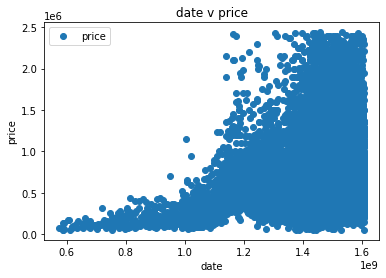

In [4]:
house_prices_df.plot(x='date', y='price', style='o')
plt.title('date v price')
plt.xlabel('date')
plt.ylabel('price')
plt.show()

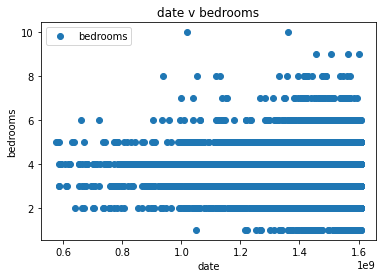

In [5]:
house_prices_df.plot(x='date', y='bedrooms', style='o')
plt.title('date v bedrooms')
plt.xlabel('date')
plt.ylabel('bedrooms')
plt.show()

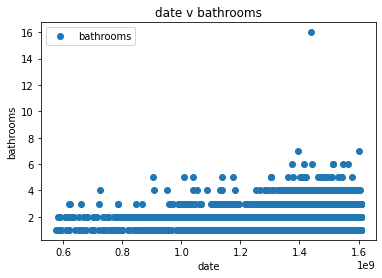

In [6]:
house_prices_df.plot(x='date', y='bathrooms', style='o')
plt.title('date v bathrooms')
plt.xlabel('date')
plt.ylabel('bathrooms')
plt.show()

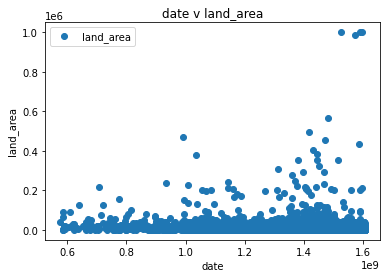

In [7]:
house_prices_df.plot(x='date', y='land_area', style='o')
plt.title('date v land_area')
plt.xlabel('date')
plt.ylabel('land_area')
plt.show()

In [8]:
# Use train_test_split to create training and testing data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y)

In [9]:
# Create the model using LinearRegression
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [10]:
# Fit the model to the training data and calculate the scores for the training and testing data

model.fit(X_train, y_train)
training_score = model.score(X_train, y_train)
testing_score = model.score(X_test, y_test)

print(f"Training Score: {training_score}")
print(f"Testing Score: {testing_score}")

Training Score: 0.03755922777225429
Testing Score: 0.028050152032775832


In [11]:
# Save the model
model.save("smartphone_trained.h5")

AttributeError: 'LinearRegression' object has no attribute 'save'